# Identify Plate

Additional content below.

Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /Users/antun/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-11-30 Python-3.9.16 torch-2.1.1 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


---------------


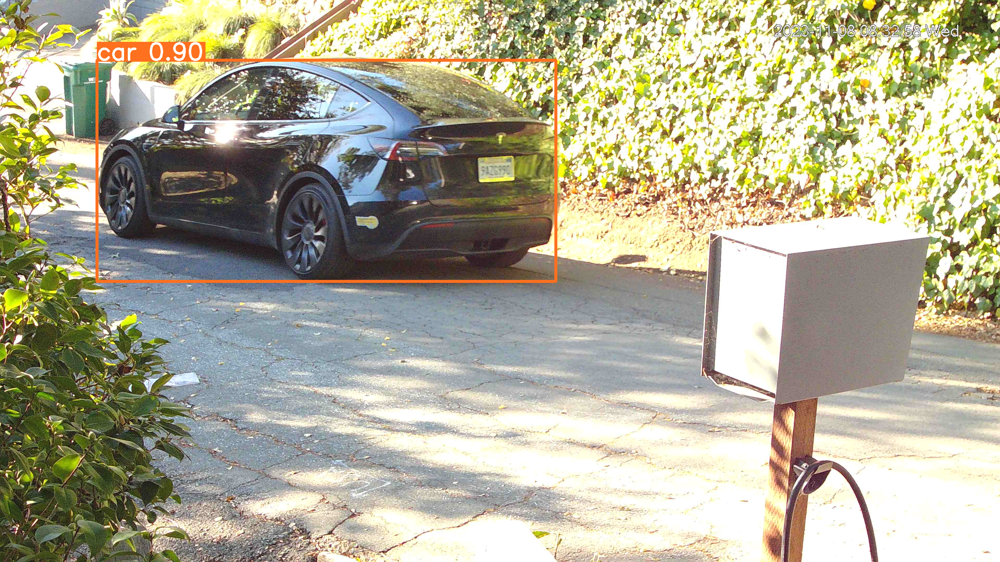

In [13]:
# YOLOv5 PyTorch HUB Inference (DetectionModels only)
import torch

model = torch.hub.load('ultralytics/yolov5', 'yolov5s', force_reload=True, trust_repo=True)  # or yolov5n - yolov5x6 or custom
im = 'tmp/_files_files-mailseth_MailCam_2023-11-08_001_jpg_08_32.58[M][0@0][0].jpg'
# im = 'https://ultralytics.com/images/zidane.jpg'  # file, Path, PIL.Image, OpenCV, nparray, list
results = model(im)  # inference
print("---------------")
#results.print()  # or .show(), .save(), .crop(), .pandas(), etc.
results.show()

In [12]:
results.pandas()

YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 2160x3840 1 car
Speed: 184.5ms pre-process, 169.8ms inference, 1.5ms NMS per image at shape (1, 3, 384, 640)

In [16]:
results.print()

image 1/1: 2160x3840 1 car
Speed: 134.0ms pre-process, 99.4ms inference, 1.5ms NMS per image at shape (1, 3, 384, 640)


In [25]:
x_1 = results.xyxy[0][0][0]
y_1 = results.xyxy[0][0][1]
x_2 = results.xyxy[0][0][2]
y_2 = results.xyxy[0][0][3]
print(x_1, y_1, x_2, y_2)

tensor(372.33499) tensor(231.00412) tensor(2134.03638) tensor(1081.59436)


In [61]:
from transformers import YolosFeatureExtractor, YolosForObjectDetection, YolosImageProcessor
from PIL import Image
import requests


car_image = Image.open(open(im, "rb"))

feature_extractor = YolosFeatureExtractor.from_pretrained('nickmuchi/yolos-small-finetuned-license-plate-detection')
plate_model = YolosForObjectDetection.from_pretrained('nickmuchi/yolos-small-finetuned-license-plate-detection')
inputs = feature_extractor(images=car_image, return_tensors="pt")
outputs = plate_model(**inputs)

# model predicts bounding boxes and corresponding face mask detection classes
logits = outputs.logits
bboxes = outputs.pred_boxes


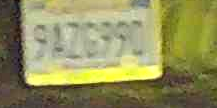

In [72]:
image_processor = YolosImageProcessor.from_pretrained('hustvl/yolos-tiny')
target_sizes = torch.tensor([car_image.size[::-1]])
results = image_processor.post_process_object_detection(outputs, threshold=0.7, target_sizes=target_sizes)[0]
box = results['boxes'][0]
box = [round(i, 2) for i in box.tolist()]
plate_image = car_image.crop((box[0], box[1], box[2], box[3]))
plate_image

In [94]:
from io import BytesIO
byte_io = BytesIO()
plate_image.save(byte_io, 'jpeg')
byte_io.seek(0)

response = requests.post('http://localhost:8080', files={
        'data': (
           'plate.jpg',
            byte_io,
            'image/jpeg'
        )
    })
                         
response.json().get('plate')


'RAZG990'